# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Lines Finding on the Road** 
***


The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

Create a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below). Once you have a working pipeline, try it out on the videos stored in the respository.

---

![title](lane-drawn.jpg)
___Example of pipeline output___

Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.

## Import Packages

In [1]:
# Importing some packages
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import os
from datetime import datetime
%matplotlib inline

## Advanced Lane Detection Pipeline

### Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


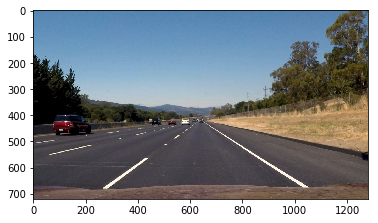

In [3]:
# Reading a test image
image = mpimg.imread('test_images/test7_straight_lines2.jpg')
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

### Camera Calibration

Before anything a camera calibration process should be performed. This process ensures that any distortion (__radial__ -> straight lines that appear curved, and **tangential** -> occurs because image taking lense is not aligned perfectly parallel to the imaging plane) will be removed.

In [4]:
def camera_calibration():
    '''Extract object points and image points for camera calibration
    '''

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # -1 is to figure out how many rows (in this case)
   
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners. Corners is an array of the position (x,y) for each corner from left-right, top-bottom
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
    plt.imshow(img)
    return objpoints, imgpoints

def cal_undistort(img, objpoints, imgpoints, show = False, save = False):
    '''Distortion correction after camera calibration
    '''
    
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    # undistort
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if show is True:
        # Plot the results
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(undist)
        ax2.set_title('Undistorted Image', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save is True:
        mpimg.imsave(os.path.join(output_dir,'Undistorted'+str(get_time())+'.png'),undist)
    
    return undist, mtx, dist

def corners_unwarp(undist, nx, ny, mtx, dist):
    '''Warp image to plain vision
    '''
    
    img = undist
    # 1) Undistort using mtx and dist
    # 2) Convert to grayscale
    gray = cv2.cvtColor(undist,cv2.COLOR_BGR2GRAY)
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
    
    # 4) Transform the image to plain perspective
    if ret == True:
        # The src points correspond to the outer corners retreieved from camera calibration
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        #
        rows, cols, ch = img.shape
        reg = 100 # How much we "save" the original image when transforming
        dst = np.float32([[reg,reg],[cols-reg, reg],[cols-reg, rows-reg],[reg, rows-reg]])
        # Get perspective transform matrix
        M = cv2.getPerspectiveTransform(np.float32(src.tolist()),
                                        np.float32(dst.tolist()))
        # e) Perspective warping
        warped = cv2.warpPerspective(undist, M, (cols, rows))
    
    return warped, M

ERROR
ERROR
ERROR
ERROR


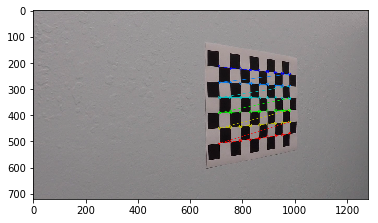

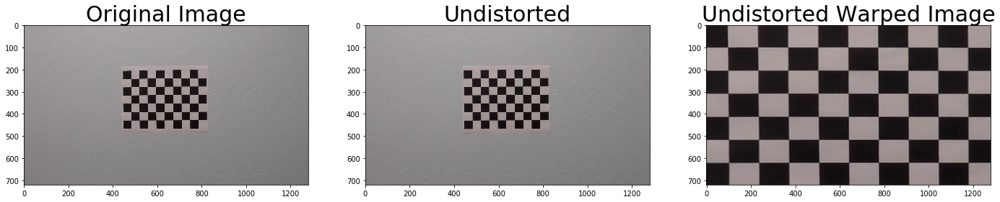

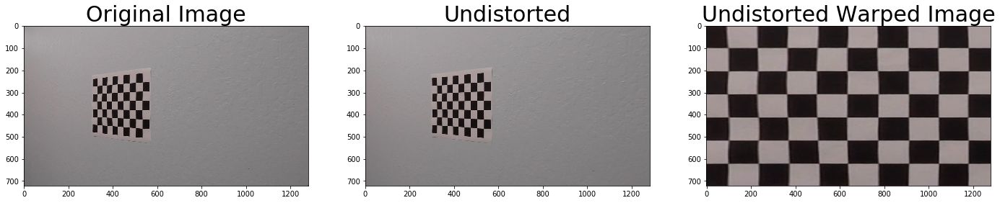

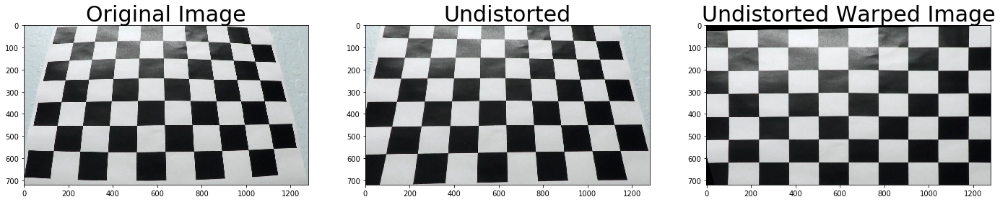

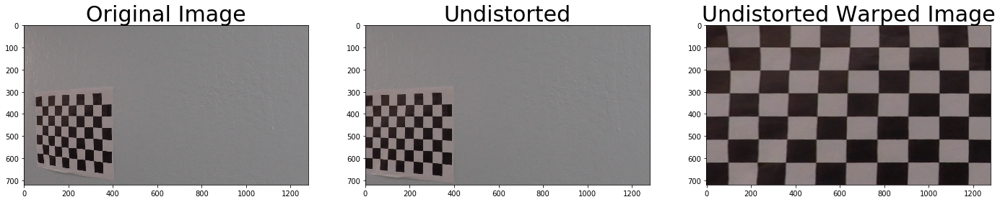

...

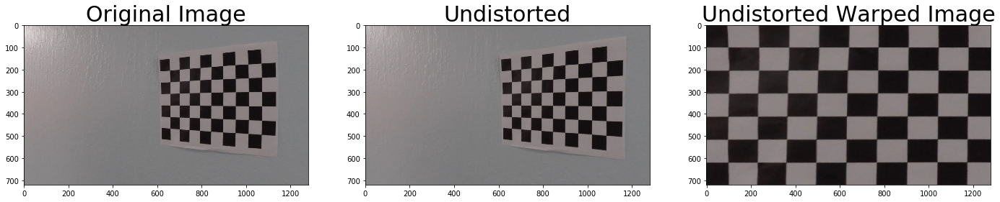

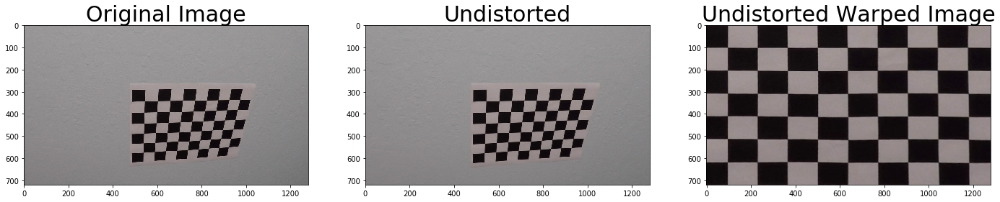

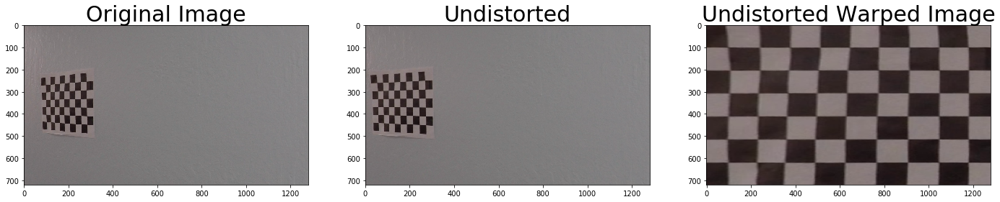

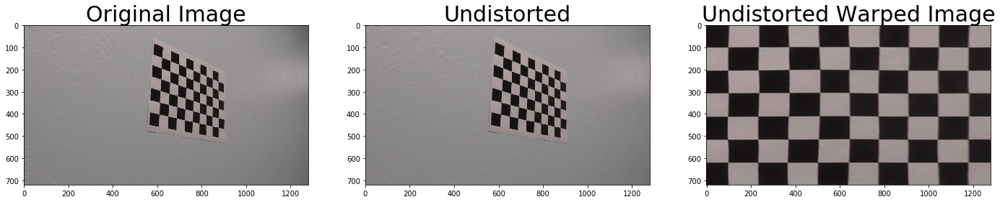

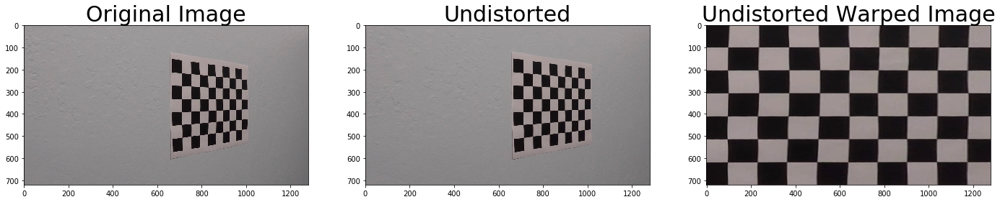

In [5]:
images = glob.glob('camera_cal/calibration*.jpg')
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
# camera calibration, step through the list and search for chessboard corners
objpoints, imgpoints = camera_calibration()

# Test on calibration images
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    try:
        # Run WARP transformation pipeline
        undistorted, mtx, dist = cal_undistort(img, objpoints, imgpoints)
        warped,_ = corners_unwarp(undistorted,nx,ny,mtx,dist)
        fig = plt.figure(figsize=(24,9))
        plt.subplot(131)   
        plt.imshow(img)
        plt.title('Original Image',fontsize=30)
        plt.subplot(132)
        plt.imshow(undistorted)
        plt.title('Undistorted',fontsize=30)
        plt.subplot(133)
        plt.imshow(warped)
        plt.title('Undistorted Warped Image',fontsize=30)
    except:
        print('ERROR')

## Filtering - Lane Detection

Below are some helper functions.

In [6]:
def hsv_display(img):
    '''Extract HSV channels
    '''
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    H = hsv[:,:,0]
    S = hsv[:,:,1]
    V = hsv[:,:,2]

    fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(20, 9))
    fig.tight_layout()
    ax1.imshow(H,cmap='gray')
    ax1.set_title('H', fontsize=30)
    ax2.imshow(S, cmap='gray')
    ax2.set_title('S', fontsize=30)
    ax3.imshow(V, cmap='gray')
    ax3.set_title('V', fontsize=30)
    ax4.imshow(hsv, cmap='gray')
    ax4.set_title('HSV', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    
    return H, S, V, hsv

def hls_display(img):
    '''Extract HLS channels
    '''
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]

    fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(20, 9))
    fig.tight_layout()
    ax1.imshow(H,cmap='gray')
    ax1.set_title('H', fontsize=30)
    ax2.imshow(L, cmap='gray')
    ax2.set_title('L', fontsize=30)
    ax3.imshow(S, cmap='gray')
    ax3.set_title('S', fontsize=30)
    ax4.imshow(hls, cmap='gray')
    ax4.set_title('HLS', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    return H, L, S, hls

def get_time():
    '''Obtain current time
    '''
    ts = str(datetime.now()).split(' ')
    date = ''.join(ts[0].split('-'))
    hour = ''.join(ts[1].split(':'))
    date_s = date + '_' + hour
    return date_s

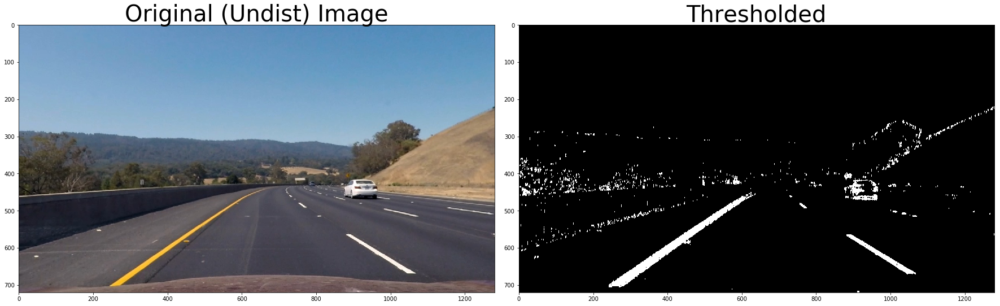

In [7]:
def filtering(img, s_thresh=(170, 255), sx_thresh=(15, 100), show = False, save = False):
    '''Create a thresholded binary image through color filtering
    '''
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #hsv_display(img)
    #hls_display(img)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    color_binary = s_binary | sxbinary
    color_binary = cv2.dilate(color_binary, (3,3), iterations=2)

    if show is True:
        # Plot the results
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(img)
        ax1.set_title('Original (Undist) Image', fontsize=40)

        ax2.imshow(color_binary,'gray')
        ax2.set_title('Thresholded', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save is True:
        color_binary_3d = np.stack((color_binary,)*3, axis = -1)
        color_binary_3d[color_binary_3d == 1] = 255
        mpimg.imsave(os.path.join(output_dir,'Thresholded'+str(get_time())+'.png'),color_binary_3d)
    
    return color_binary
    
img = mpimg.imread('test_images/test3.jpg')
undistorted, _, _ = cal_undistort(img, objpoints, imgpoints)
thresholded = filtering(undistorted, show = True, save = False)

## Perspective Transform ( birds-eye view )

In [8]:
def birds_perspective(undist, show = False, save = False): 
    '''Apply a perspective transform to rectify binary image,"birds-eye view"
    '''  
    
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    src = np.float32([[500, 482],[790, 482],
                      [1280, 720],[70, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    # Get M and Minv to transform images
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform( dst,src)
    
    # Transformed image, top-view
    warped = cv2.warpPerspective(undist, M, img_size)
    
    if show is True:
        # Plot the results
        color=(255,0,0)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        '''cv2.line(undist, (490, 482), (810, 482),color, 5)#
        cv2.line(undist, (490, 482), (40, 720), color,5)#
        cv2.line(undist, (810, 482), (1280, 720), color,5)#'''
        if len(undist.shape)==3:
            ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        else:
            ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_GRAY2RGB))
        ax1.imshow(undist, cmap='gray')
        ax1.set_title('Thresholded', fontsize=50)

        ax2.imshow(warped, cmap='gray')
        ax2.set_title('Warped', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save is True:
        warped_color = np.stack((warped,)*3, axis = -1)
        warped_color[warped_color == 1] = 255
        mpimg.imsave(os.path.join(output_dir,'Warped'+str(get_time())+'.png'),warped_color)
    
    return warped, M, Minv

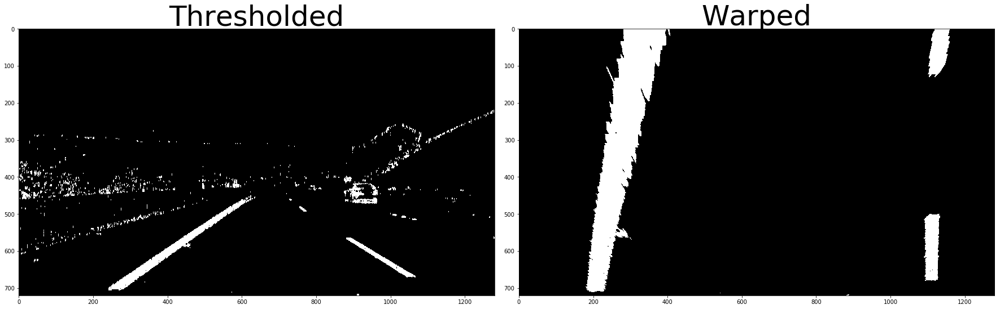

In [9]:
warped,M,Minv = birds_perspective(thresholded, True, False);

## Histogram

A histogram on the warped image is computed so that lane references are given before a windowing process for lane prediction

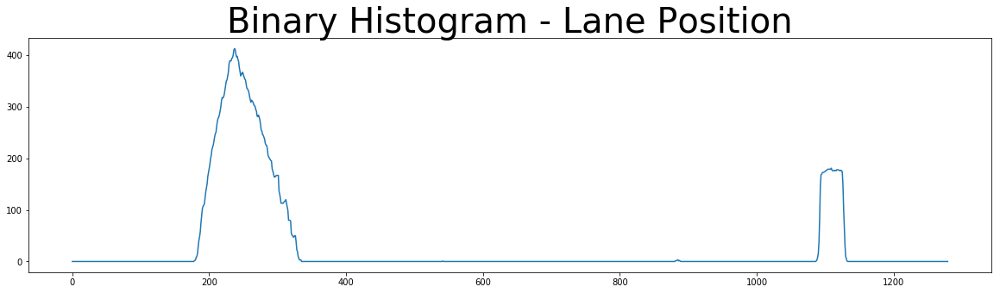

In [10]:
def hist(img, show = False, save = False):
    '''Detect lane pixels to find lane references
    ''' 
    
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//3:,:]
    # Sum across image pixels vertically, axis = 0 in vertical, 1 horizontal
    histogram = np.sum(bottom_half, axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)

    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    if show is True:
        f, (ax1) = plt.subplots(1, 1, figsize=(20, 5))
        ax1.plot(histogram)
        ax1.set_title('Binary Histogram - Lane Position', fontsize=40)
    
    if save is True:
        f, (ax1) = plt.subplots(1, 1, figsize=(20, 5))
        ax1.plot(histogram)
        ax1.set_title('Binary Histogram - Lane Position', fontsize=40)
        plt.close()
        f.savefig(os.path.join(output_dir,'Histogram'+str(get_time())+'.png'))
    
    return histogram

# Create histogram of image binary activations
histogram = hist(warped, True, False)

## Windowing

### Measuring Curvature

In [13]:
def measure_curvature(leftx, rightx, lefty, righty, ploty):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    
     # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.abs(2*left_fit_cr[0])
    right_curverad =((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.abs(2*right_fit_cr[0])
    
    curve_rad = int((left_curverad + right_curverad)/2)
    #print('Radius of curvature: {0} m'.format(curve_rad))
    return curve_rad

### Lane fit

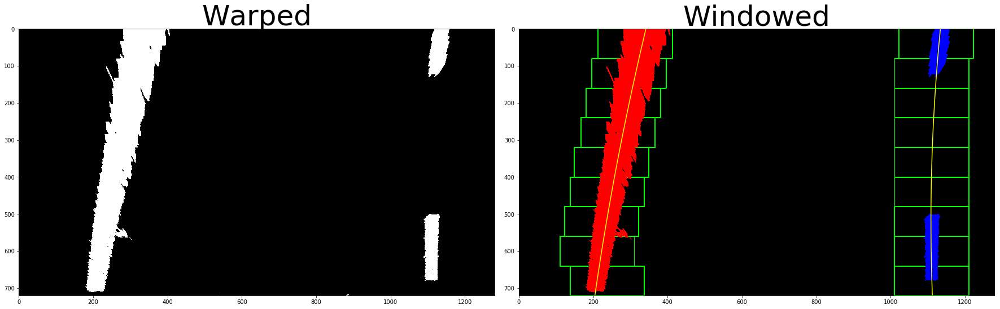

In [15]:
def find_lane_pixels(binary_warped):
    '''Fit to find the lane boundary 
    '''
    
    # Take a histogram of the bottom half of the image
    #histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    # They belong to the middle point of each peak
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low =   leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### if nr of points found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:   
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def windowing(binary_warped, show = False, save = False):
    '''Find the lane boundary through a windowing process. 
       Process images from bottom to top and fit a line
    '''
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #print('left_fit: ', left_fit)
    #print('right_fit: ', right_fit)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    # Calculate the radius of curvature in pixels for both lane lines
    curve_rad = measure_curvature(leftx, rightx,lefty, righty, ploty)
    
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    '''# Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')'''
    
    '''out_img[list(map(int, ploty)), list(map(int, left_fitx))] = [255, 255, 0]
    out_img[list(map(int, ploty)), list(map(int, right_fitx))] = [255, 255, 0]'''
    
    if show is True:
        # Plot the results
        color=(255,0,0)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        if len(binary_warped.shape)==3:
            ax1.imshow(cv2.cvtColor(binary_warped, cv2.COLOR_BGR2RGB))
        else:
            ax1.imshow(cv2.cvtColor(binary_warped, cv2.COLOR_GRAY2RGB))
        ax1.imshow(binary_warped, cmap='gray')
        ax1.set_title('Warped', fontsize=50)

        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        ax2.imshow(out_img, cmap='gray')
        ax2.set_title('Windowed', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save is True:
        mpimg.imsave(os.path.join(output_dir,'Windowing'+str(get_time())+'.png'),out_img)
    
    return left_fit,right_fit, ploty, left_fitx, right_fitx, out_img, curve_rad

left_fit,right_fit, ploty, left_fitx, right_fitx, out_img, curve_rad = windowing(warped, True)

## Visualise Results

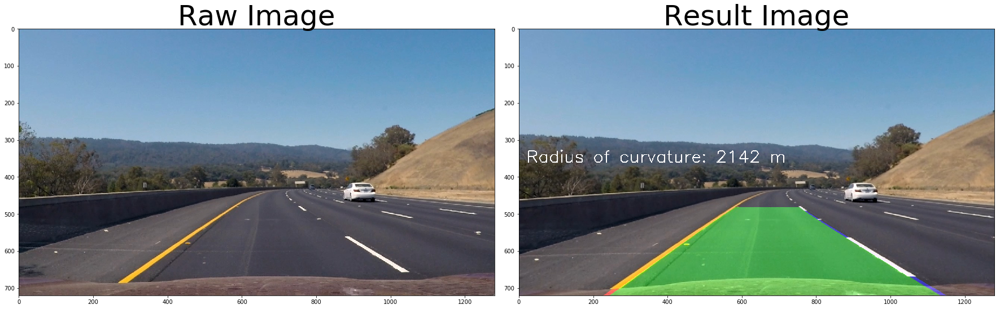

In [16]:
def lane_vis(undist, warped, ploty, left_fitx , right_fitx, Minv, curve_rad, show = False, save = False):
    '''Unwarps the resultant image and visualise the results 
    '''
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    warp_color = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
           
    # Draw the lane onto the warped blank image
    cv2.fillPoly(warp_color, np.int_([pts]), (0,200, 0))
    cv2.polylines(warp_color, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=15)
    cv2.polylines(warp_color, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=15)

    # Warp the blank back to original image space using the inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(warp_color, Minv, (undist.shape[:2][::-1]))
    
    # Combine the result with the original image for transparency
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)

    # Add Radius of curvature to the output image
    font = cv2.FONT_ITALIC
    cv2.putText(result,'Radius of curvature: {0} m'.format(curve_rad),(20,int(undist.shape[0]/2)),font,1.5,(255,255,255),2)
    
    if show is True:
        # Plot the results
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        
        ax1.imshow(img)
        ax1.set_title('Raw Image', fontsize=50)
        
        ax2.imshow(result, cmap='gray')
        ax2.set_title('Result Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save is True:
        mpimg.imsave(os.path.join(output_dir,'FitLane'+str(get_time())+'.png'),result)
    
    return result

output = lane_vis(undistorted,warped,ploty, left_fitx , right_fitx, Minv, curve_rad, True)

## Results Frame

In [17]:
def results_steps(undistorted,warped,thresholded,result,windowed,Minv,show = False, save = False):
    '''Visualise the results including processing steps on final output  
    '''
    
    height, width = result.shape[0:2]
    # Initialise canvas
    canvas = np.zeros((height,width,3),dtype=np.uint8)
    canvas = result.copy()
    # Initialise background image for transparency
    bckgnd = np.zeros((height,int(width),3),dtype=np.uint8)
    bckgnd = result.copy()
    # Draw transparency, black rectangle
    cv2.rectangle(canvas, (0, 0), (int(width), int(height/2.5)),(0, 0, 0), -1)
    canvas = cv2.addWeighted(bckgnd,0.3,canvas,0.7,0,canvas)
    
    # Convert 2D image to a 3D image
    #warped_color = np.dstack((warped, warped, warped))
    #warped_color = cv2.cvtColor(warped, cv2.COLOR_GRAY2BGR)
    warped_color = np.stack((warped,)*3, axis = -1)
    warped_color[warped_color == 1] = 255
    
    unwarped_thresh = warped.copy()
    unwarped_thresh = cv2.warpPerspective(unwarped_thresh, Minv, (undistorted.shape[:2][::-1]))
    unwarped_thresh_color = np.stack((unwarped_thresh,)*3, axis = -1)
    unwarped_thresh_color[unwarped_thresh_color == 1] = 255
    
    # Set variables for step images allocation
    offset = 20 # Frame surrounding images
    space = 7 # Sapce to ensure offset
    stepWindow_ylim = int(height/2.5)-20
    stepWindow_xlim = int(np.floor(width/3))
    
    # Allocate thresholded, warped and windowing images on final frame
    canvas[offset:stepWindow_ylim,offset:stepWindow_xlim-space] = cv2.resize(unwarped_thresh_color, (stepWindow_xlim-offset-space,stepWindow_ylim-20), interpolation=cv2.INTER_AREA)
    canvas[offset:stepWindow_ylim,stepWindow_xlim+offset-space:2*stepWindow_xlim-2*space] = cv2.resize(warped_color, (stepWindow_xlim-offset-space,stepWindow_ylim-20), interpolation=cv2.INTER_AREA)
    canvas[offset:stepWindow_ylim,2*stepWindow_xlim+offset-2*space:3*stepWindow_xlim-offset-1] = cv2.resize(windowed, (stepWindow_xlim-offset-space,stepWindow_ylim-20), interpolation=cv2.INTER_AREA)
    
    if show is True:
        # Plot the results
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(result)
        ax1.set_title('Result Image', fontsize=50)

        ax2.imshow(canvas, cmap='gray')
        ax2.set_title('Steps Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save is True:
        mpimg.imsave(os.path.join(output_dir,'ResultPipeline'+str(get_time())+'.png'),canvas)
    return canvas

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

In [25]:
# Set output directory name
output_dir = 'output_images'
def pipeline(img, show = False, save = False):
    '''Pipeline that will draw lane lines on the test_images
       then save them to the test_images_output directory, if given 
    '''
    
    # Remove image distortion
    undistorted, _,_ = cal_undistort(img, objpoints, imgpoints, show,save);
    # Filtering (Thresholding) for Lane Detection
    thresholded = filtering(undistorted, show = show, save = save)
    # Apply a perspective transformation to obtain a 'birds-eye view'
    warped,M,Minv = birds_perspective(thresholded, show, save)
    # Create histogram for detection of lane position
    histogram = hist(warped, show, save)
    # Windowing for lane fit and radius of curvature
    left_fit,right_fit, ploty, left_fitx, right_fitx, windowed, curve_rad = windowing(warped, show, save)
    # Unwarp resultant image
    result = lane_vis(undistorted,warped,ploty, left_fitx , right_fitx, Minv, curve_rad, show)
    # Display of final image with processing steps
    result = results_steps(undistorted,warped,thresholded,result,windowed, Minv, False, save)
        
    return result

## Test on Images

8 images found in folder



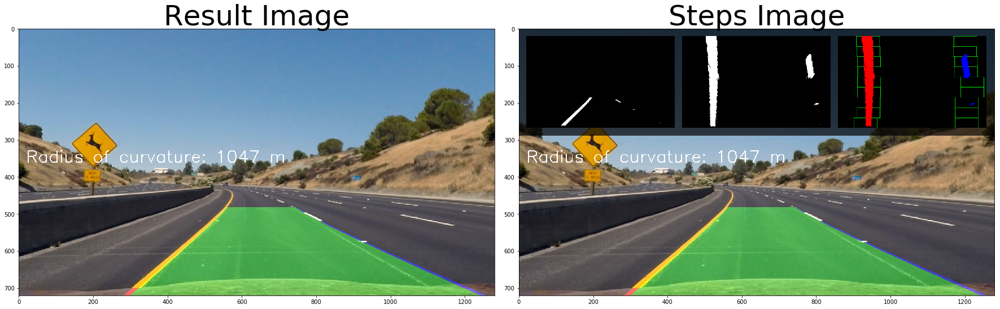

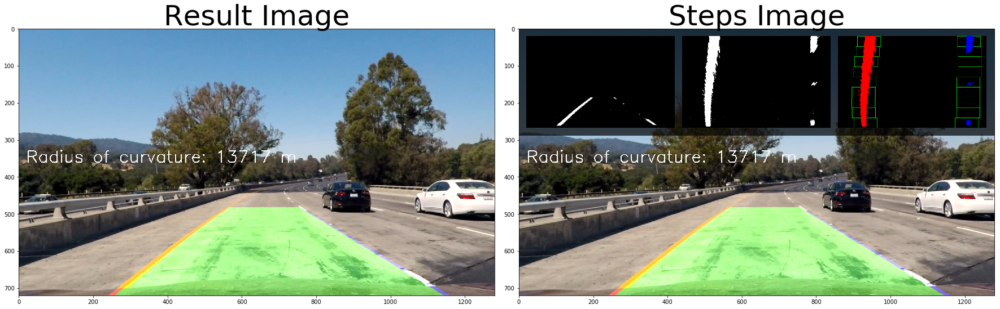

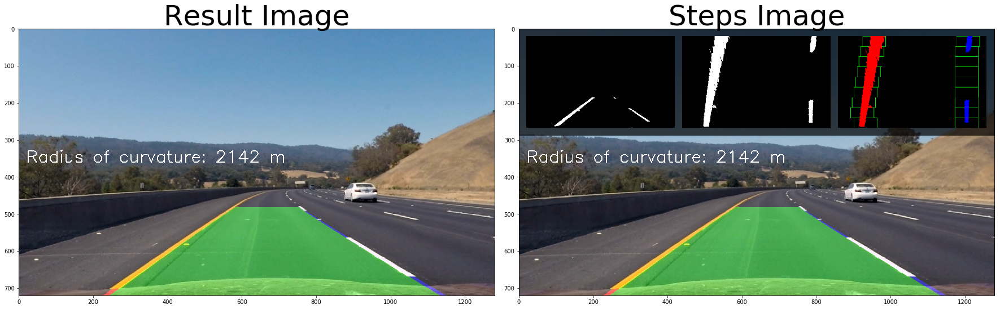

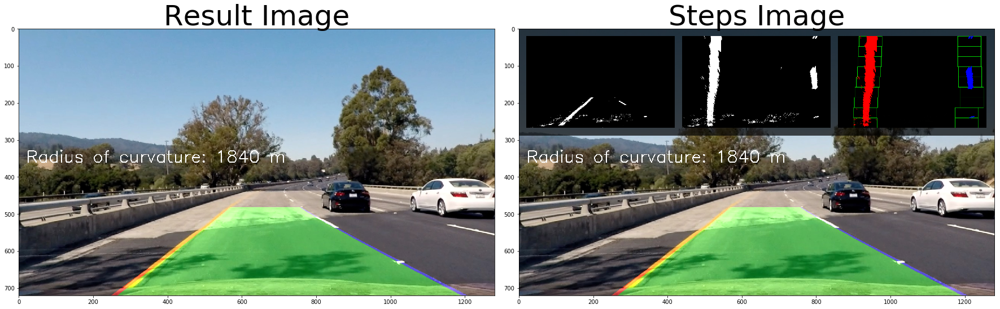

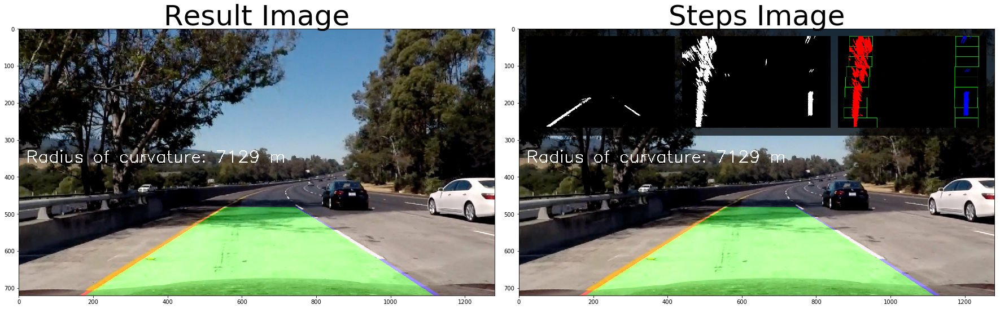

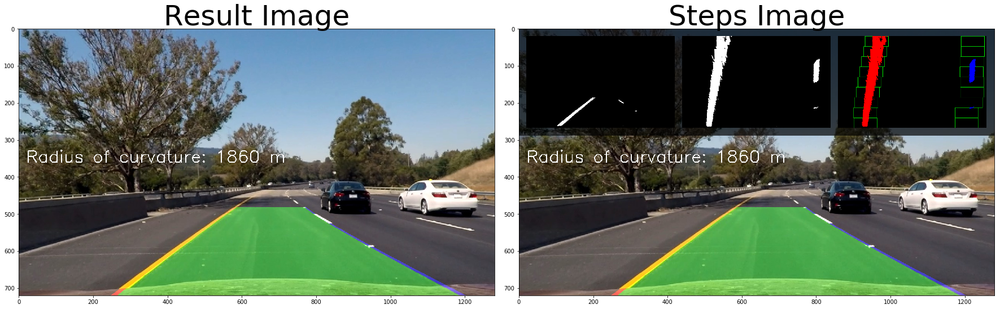

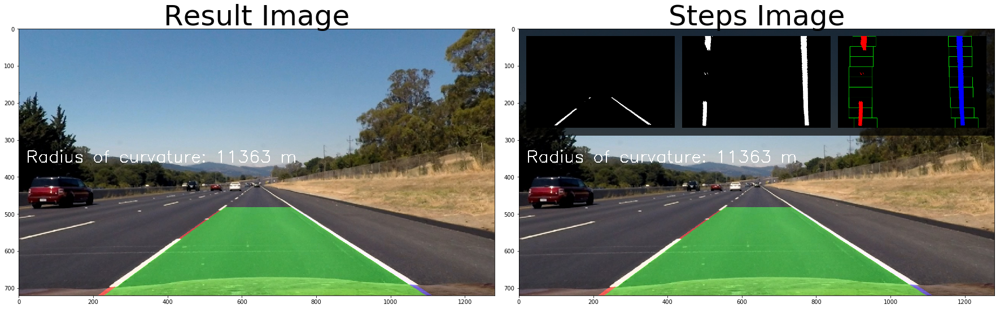

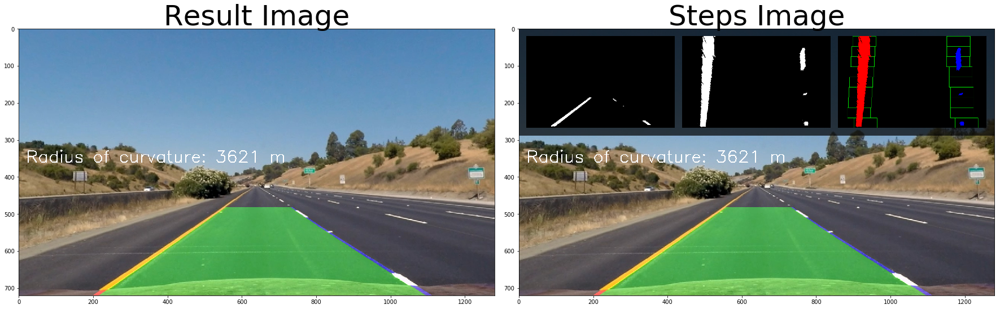

In [19]:
images = sorted(glob.glob('test_images/*.jpg' ))
print('{0} images found in folder'.format(len(images)),end='\n\n')
save = True
show = False
for image in images:
    img = mpimg.imread(image)
    # Run pipeline on the current image
    pipeline(img, show, save)
    # Save images for the first frame processed
    save = False

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`project_video.mp4`

`challenge_video.mp4`

There is another video, `harder_challenge_video.mp4`, let's see the results ...

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [20]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [22]:
def process_image(img):
    '''Execute the pipeline
    '''
    try:
        # Returns the final output (image where lines are drawn on lanes and filled)
        result = pipeline(img, show = False)
    except:
        result = img
        
    return result

__Let's try with the 'project_video.mp4' first ...__

In [30]:
video_test = "project_video.mp4"
video_name = video_test.split('.')[0]

white_output = 'output_images/'+video_name+str(get_time())+'.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip(video_test)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video20181231_153342.326696.mp4
[MoviePy] Writing video output_images/project_video20181231_153342.326696.mp4


100%|█████████▉| 1260/1261 [18:25<00:00,  1.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video20181231_153342.326696.mp4 

CPU times: user 18min 55s, sys: 32 s, total: 19min 27s
Wall time: 18min 26s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [31]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

__Let's try with the 'challenge_video.mp4' now ...__

In [26]:
# Load the video
video_test = "challenge_video.mp4"
video_name = video_test.split('.')[0]
# Run the pipeline on the video
white_output = 'output_images/'+video_name+str(get_time())+'.mp4'
clip1 = VideoFileClip(video_test)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_images/challenge_video20181231_142451.581390.mp4
[MoviePy] Writing video output_images/challenge_video20181231_142451.581390.mp4


100%|██████████| 485/485 [07:12<00:00,  1.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/challenge_video20181231_142451.581390.mp4 

CPU times: user 7min 20s, sys: 10.2 s, total: 7min 30s
Wall time: 7min 13s


In [27]:
# Play the video inline
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

**There is a 'harder_challenge_video.mp4', let's try it...**

In [28]:
# Load the video
video_test = "harder_challenge_video.mp4"
video_name = video_test.split('.')[0]
# Run the pipeline on the video
white_output = 'output_images/'+video_name+str(get_time())+'.mp4'
clip1 = VideoFileClip(video_test)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_images/harder_challenge_video20181231_143244.772365.mp4
[MoviePy] Writing video output_images/harder_challenge_video20181231_143244.772365.mp4


100%|█████████▉| 1199/1200 [18:20<00:00,  1.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/harder_challenge_video20181231_143244.772365.mp4 

CPU times: user 18min 47s, sys: 29.4 s, total: 19min 16s
Wall time: 18min 20s


In [29]:
# Play the video inline
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))